# **Task Description**

1. Design and development of your own denoising algorithm that must involve
Fourier
Transform. While designing the algorithm you may want to                                
a. Consider adding further pre-processing and post processing steps of your choice,  
b. Get  inspiration  from  existing  literature  (one  or  more)  which  you  must  cite  in  your
report and code.
The input to your code will be original and noisy images. The output will be denoised image
and scores of comparison metrics. [40]
2. Compare your algorithm with the following denoising methods.     
a. Mean filter                       
b. Median filter                        
c. Wavelet denoising (e.g., VisuShrink or BayesShrink)                 [10]                  
3. Compare the original and denoised images using two metrics, such as,                                  
a. Mean Squared Error (MSE) and                    
b. Structural SIMilarity (SSIM) index                     [5]
4. Generate and report results with graphs/tables (and sample images) using the given dataset
of 25 original and noisy images.  Data acknowledgement: The Berkeley Segmentation
Dataset and Benchmark
https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/                                [5]
You  need  to  demonstrate  (compulsory)  the  code  and  answer  related  questions  on  designated
days. If you fail to demonstrate (/absent), the entire corresponding task(s) will be marked as zero.
5. Write a report as described at the beginning of the brief.                                                    [40]
6. Demonstrate your code and answer questions.    

# **Importing Required Libraries**

In [ ]:
import numpy as np
import cv2
import math
import itertools
import matplotlib.pyplot as plt
from os import listdir

from scipy import fftpack, ndimage as nd
from scipy.signal import gaussian
from scipy.fft import fft2, fftshift, ifft2

from skimage import measure
from skimage import img_as_ubyte
from skimage.exposure import rescale_intensity
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio
from skimage.metrics import mean_squared_error
from skimage.restoration import estimate_sigma, denoise_wavelet, denoise_nl_means
from skimage.filters import median
from skimage.morphology import disk

**Directory path for dataset**

In [ ]:
#image_set = './drive/MyDrive/Dataset-denoising/Task-A-Dataset-denoising'
#file_list = listdir(image_set)
#file_list.sort()

In [ ]:
image_set = 'C:/Users/Paul Jr/Downloads/Dataset-denoising/Task-A-Dataset-denoising'
file_list = listdir(image_set)
file_list.sort()

In [ ]:
print(file_list)

['noisy10', 'noisy25', 'noisy50', 'original']


# **Loading data and initializing objects for initial images, processed images and results**

In [ ]:
class FilteredImgAttr:
  def __init__(self):
    self.img = None
    self.mse = None
    self.ssim = None
    self.psd = None #power spectrum density
    self.mse_list = []
    self.k_values = []
    self.ssim_list = []
    self.best_k = None
    self.best_mse = None
    self.best_ssim = None
    self.psnr = None

class PreFilteredImgAttr:
  def __init__(self, im):
    self.img = im
    self.mse = None
    self.ssim = None
    self.psnr = None

class ImageSet:
  def __init__(self, noisy10, noisy25, noisy50, original):
    #Noisy Images
    self.img0 = PreFilteredImgAttr(noisy10)
    self.img1 = PreFilteredImgAttr(noisy25)
    self.img2 = PreFilteredImgAttr(noisy50)
    #Structural Similarity
    self.img0_ssim = None
    self.img1_ssim = None
    self.img2_ssim = None
    #Mean Squared Error
    self.img0_mse = None
    self.img1_mse = None
    self.img2_mse = None
    #Power Spectrum Density
    self.img0_psd = None
    self.img1_psd = None
    self.img2_psd = None
    self.original_psd = None
    #Proposed Filter Obj
    self.img0_filtered = FilteredImgAttr()
    self.img1_filtered = FilteredImgAttr()
    self.img2_filtered = FilteredImgAttr()
    self.img0_filtered_list = []
    self.img1_filtered_list = []
    self.img2_filtered_list = []
    #Mean Filter
    self.img0_mean_fltr = FilteredImgAttr()
    self.img1_mean_fltr = FilteredImgAttr()
    self.img2_mean_fltr = FilteredImgAttr()
    #Median Filter
    self.img0_median_fltr = FilteredImgAttr()
    self.img1_median_fltr = FilteredImgAttr()
    self.img2_median_fltr = FilteredImgAttr()
    #Wavelet Filter (Visushrink)
    self.img0_visu_fltr = FilteredImgAttr()
    self.img1_visu_fltr = FilteredImgAttr()
    self.img2_visu_fltr = FilteredImgAttr()
    #Wavelet Filter (Bayes)
    self.img0_bayes_fltr = FilteredImgAttr()
    self.img1_bayes_fltr = FilteredImgAttr()
    self.img2_bayes_fltr = FilteredImgAttr()
    #Original Image
    self.original_img = original

    self.blended_img = np.zeros_like(original)
    self.denoised = []

img_arr = []


for j in range(25):
  p1 = None
  p2 = None
  p3 = None
  p4 = None
  if(j<10):
    p1 = plt.imread(image_set+'/noisy10/000'+str(j)+'.png').astype(np.float32)
    p2 = plt.imread(image_set+'/noisy25/000'+str(j)+'.png').astype(np.float32)
    p3 = plt.imread(image_set+'/noisy50/000'+str(j)+'.png').astype(np.float32)
    p4 = plt.imread(image_set+'/original/000'+str(j)+'.png').astype(np.float32)
  else:
    p1 = plt.imread(image_set+'/noisy10/00'+str(j)+'.png').astype(np.float32)
    p2 = plt.imread(image_set+'/noisy25/00'+str(j)+'.png').astype(np.float32)
    p3 = plt.imread(image_set+'/noisy50/00'+str(j)+'.png').astype(np.float32)
    p4 = plt.imread(image_set+'/original/00'+str(j)+'.png').astype(np.float32)
  obj = ImageSet(p1,p2,p3,p4)
  img_arr.append(obj)

Selecting the array size

In [ ]:
#img_arr = img_arr[:5]

# **Functions used for denoising and evaluating metrics**

In [ ]:
def getMSE(in_img,out_img):
  in_img = rescale_intensity(in_img, in_range='image', out_range=(0,255))
  out_img = rescale_intensity(out_img, in_range='image', out_range=(0,255))
  return mean_squared_error(in_img,out_img)

def getSSIM(original, noisy):
  return ssim(original, noisy, multichannel=True)

def getPSNR(in_img,out_img):
  psnr = peak_signal_noise_ratio(in_img, out_img)
  return psnr

def metric(original_image, restored_image, input_image):
  #Spectral Density of input noise / Spectral Density of Output noise
  a = (np.sum(np.square(abs(fftpack.fft2(original_image-input_image))))/(input_image.shape[0]**2))
  b = (np.sum(np.square(abs(fftpack.fft2(original_image-restored_image))))/(input_image.shape[0]**2))
  return 10*np.log10(a/b)

#power spectrum density plots
def psd(img, type):
  title = None
  if(type=='Original'):
    title ='PSD for Original Image'
  elif(type=='Noisy10'):
    title ='PSD for Noisy10 Image'
  elif(type=='Noisy25'):
    title ='PSD for Noisy25 Image'
  elif(type=='Noisy50'):
    title ='PSD for Noisy50 Image'
  elif(type=='Filtered'):
    title ='PSD for Filtered Image'


  # Round up the size along this axis to an even number
  n = int( math.ceil(img.shape[0] / 2.) * 2 )

  #rfft for real value array
  a = np.fft.rfft(img,n, axis=0)

  # Sum power along the second axis
  a = a.real*a.real + a.imag*a.imag
  a = a.sum(axis=1)/a.shape[1]

  # Generate a list of frequencies
  f = np.fft.rfftfreq(n)

  plt.figure()
  plt.plot(f[1:],a[1:], label = 'Average power over y vs f_x')

  # Fourier Transform along the second axis
  n = int( math.ceil(img.shape[1] / 2.) * 2 )

  a = np.fft.rfft(img,n,axis=1)

  a = a.real*a.real + a.imag*a.imag
  a = a.sum(axis=0)/a.shape[0]

  f = np.fft.rfftfreq(n)

  plt.plot(f[1:],a[1:],  label ='Average power over x vs f_y')
  plt.title(title)
  plt.ylabel( 'Power' )
  plt.xlabel( 'Frequency' )
  plt.yscale( 'log' )

  plt.legend()

**Noise Estimation Functions**

In [ ]:
def noise_estimation(im: np.ndarray, type):
    """ this function determines the variance in its pixel values and displays a histogram of the image along with a fitted normal distribution."""
    # Calculate histogram
    #im = rescale_intensity(im, in_range='image', out_range=(0,255))
    im_hist, bin_edges = np.histogram(im, 30)
    bin_centers = bin_edges[:-1] + (np.diff(bin_edges) / 2)
    # Normalize histogram to make a PDF
    im_hist = im_hist.astype(float)
    im_hist /= np.sum(im_hist)
    # Calculate the mean and variance values
    mean = np.sum(im_hist * bin_centers)
    var = np.sum(im_hist * (bin_centers ** 2)) - (mean ** 2)
    # Calculate the values on the normal distribution PDF
    norm_vals = np.exp(-((bin_centers - mean) ** 2) / (2 * var)) \
            / np.sqrt(2 * np.pi * var)
    # Normalize the norm_vals
    norm_vals /= np.sum(norm_vals)
    print('Variance: {}'.format(var))
    plt.figure()
    plt.bar(bin_centers, im_hist)
    plt.plot(bin_centers, norm_vals, 'r')
    plt.legend(['Fitted Gaussian PDF', 'Histogram of image'])
    plt.title(type)
    plt.xlabel('Pixel value')
    plt.ylabel('Occurrence')
    plt.show()

**Functions to build filters**

In [ ]:
def gaussian_kernel(m):
  h = gaussian(m, m/3) # sigma = m/3 , (m -1)/6
  #print(h)
  h = h.reshape(m,1) # Gaussian Kernel has a separable property and can be represented as outer product of vectors (Mx1).(Nx1) v.v transpose
  #print(h)
  h = np.dot(h,h.transpose()) # Separable property w=v.transpose(v) |h|**2 = dot product of h and h transpose - Euclidean Norm
  #print(h)
  h = h/np.sum(h)   # Normalize the kernel:1) average in regions of constant intensity is equal to pixel intensity in filtered image 2)To avoid bias in resulting filtered image

  return h

def gaussian_kernel_new(size, sigma): #Gaussian kernel for a custom sigma value
  size = int(size) // 2
  x, y = np.mgrid[-size:size+1, -size:size+1]
  normal = 1 / (2.0 * np.pi * sigma**2)
  g = np.exp(-((x**2 + y**2) / (2.0 * sigma ** 2))) * normal
  g /= np.sum(g)
  return g

**Functions to apply filters**

In [ ]:
#lowcut = 500
#highcut = 1000

def filter_out_fq(type, temp_im, fft_image_centred, lc, hc, K, kernel_size):
  if(type=='wiener'):
    kernel = gaussian_kernel(kernel_size)
    #fft_image_centred is not centered in this case
    G = fft_image_centred

    H = np.fft.fft2(kernel,s=temp_im.shape)                                     #FFT of the gaussian kernel
    #print(kernel[:5,:5])
    cH = np.conj(H)                                                             #Complex Conjugate of degradation function
    sH = np.abs(H)**2                                                           #Square of Degradation function
    wiener_filter = cH/(sH+ K)                                                  #Wiener filter
    image_fft2 = G * wiener_filter                                              #Multiply wiener filter in frequency domain equivalent to convolution
    return image_fft2

def plot_filter(filtr):
  plt.figure(1)
  plt.imshow(filtr, cmap='gray')

**Function to isolate channels, redirect to the requested filter function and return the filtered image**

In [ ]:
def fft_color(image, type, lc, hc, K , kernel_size):
    transformed_channels = []
    filtered_channels = []
    for i in range(3):
        rgb_fft = np.fft.fft2((image[:, :, i]))
        #plot_spectrum(rgb_fft)

        if(type!=''):
          if(type=='range'):
            spectrum_filtered = filter_out_fq(type, image[:, :, i], rgb_fft, lc, hc, None, None)
            filtered_channels.append(abs(np.fft.ifft2(spectrum_filtered)))
          elif(type=='wiener'):
            spectrum_filtered = filter_out_fq(type, image[:, :, i], rgb_fft, lc, hc, K, kernel_size)
            inv_transform = abs(np.fft.ifft2(spectrum_filtered))
            filtered_channels.append(abs(inv_transform))
          else:
            centered_fft = np.fft.fftshift(rgb_fft)
            spectrum_filtered = centered_fft
            spectrum_filtered = filter_out_fq(type, image[:, :, i], centered_fft, lc, hc, None, None)

            filtered_channels.append(abs(np.fft.ifft2((np.fft.ifftshift(spectrum_filtered)))))

    final_image = np.zeros(image.shape)
    if(len(filtered_channels)==3):
      final_image = np.dstack([filtered_channels[0].astype(np.float32),
                              filtered_channels[1].astype(np.float32),
                              filtered_channels[2].astype(np.float32)])
      #print(final_image)
      final_image = rescale_intensity(final_image, in_range='image', out_range=(0,1))
      #final_image = np.clip(final_image, 0, 1)
    else:
      final_image = filtered_channels[0]
      final_image = rescale_intensity(final_image, in_range='image', out_range=(0,1))
    return final_image


In [ ]:
def other_filters(im, type):
  final_image = im.shape
  if(type=='visu'):
    final_image = denoise_wavelet(im, multichannel=True, convert2ycbcr=True,
                    method='BayesShrink', mode='soft',
                    rescale_sigma=True)
  if(type=='bayes'):
    final_image = denoise_wavelet(im, multichannel=True, convert2ycbcr=True,
                        method='VisuShrink', mode='soft',
                        sigma=np.mean(estimate_sigma(im, channel_axis=-1))/4, rescale_sigma=True)
  if(type=='median'):
    final_image = cv2.medianBlur(im, ksize=5)
  if(type=='mean'):
    final_image = cv2.blur(im,(5,5))

  final_image = rescale_intensity(final_image, in_range='image', out_range=(0,1))
  return final_image

# **EDA**

**Preprocessing step used for isolating color channels**



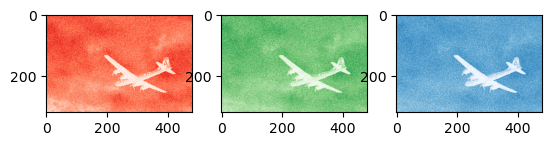

In [ ]:
im = img_arr[0].img1.img
imr = im[:, :, 0]
img = im[:, :, 1]
imb = im[:, :, 2]
fig = plt.figure()
ax = fig.add_subplot(1, 3, 1)
p = plt.imshow(imr, cmap='Reds')
ax = fig.add_subplot(1, 3, 2)
p = plt.imshow(img, cmap='Greens')
ax = fig.add_subplot(1, 3, 3)
p = plt.imshow(imb, cmap='Blues')

**Image pixel intensities in frequency domain**

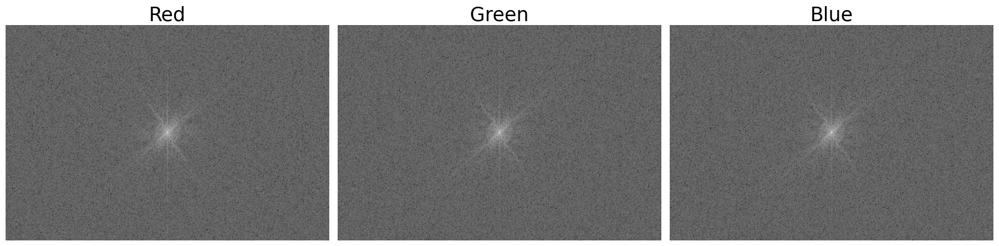

In [ ]:
imfft_rf = fftshift(fft2(imr))
imfft_gf = fftshift(fft2(img))
imfft_bf = fftshift(fft2(imb))

imm_rf = np.log(np.abs(imfft_rf))
imm_gf = np.log(np.abs(imfft_gf))
imm_bf = np.log(np.abs(imfft_gf))

fig, ax = plt.subplots(1, 3, figsize=(18,12))

ax[0].imshow(imm_rf ,cmap='gray')
ax[0].set_title('Red', fontsize = 25)
ax[0].set_axis_off()

ax[1].imshow(imm_gf ,cmap='gray')
ax[1].set_title('Green', fontsize = 25)
ax[1].set_axis_off()

ax[2].imshow(imm_bf , cmap='gray')
ax[2].set_title('Blue', fontsize = 25)
ax[2].set_axis_off()

fig.tight_layout()



EDA on noisy images

Text(0.5, 1.0, 'Noisy 50 Image Histogram (image id used =1)')

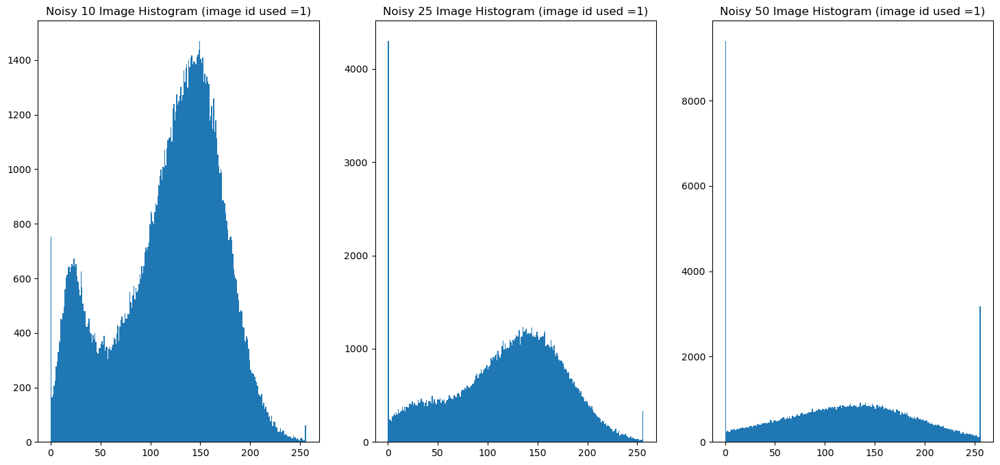

In [ ]:
id = 1
noisy0_temp_image = rescale_intensity(img_arr[id].img0.img[:,:,0], in_range='image', out_range=(0,255))
noisy1_temp_image = rescale_intensity(img_arr[id].img1.img[:,:,0], in_range='image', out_range=(0,255))
noisy2_temp_image = rescale_intensity(img_arr[id].img2.img[:,:,0], in_range='image', out_range=(0,255))
original_temp_img = rescale_intensity(img_arr[id].original_img[:,:,0], in_range='image', out_range=(0,255))
#estimateNoiseVar(noisy_temp_image,255)


fig = plt.subplots(1,3, figsize=(18,8))

plt.subplot(1, 3, 1)
plt.hist(noisy0_temp_image.ravel(),256,[0,256])
plt.title('Noisy 10 Image Histogram (image id used ='+str(id)+')')
plt.subplot(1, 3, 2)
plt.hist(noisy1_temp_image.ravel(),256,[0,256])
plt.title('Noisy 25 Image Histogram (image id used ='+str(id)+')')
plt.subplot(1, 3, 3)
plt.hist(noisy2_temp_image.ravel(),256,[0,256])
plt.title('Noisy 50 Image Histogram (image id used ='+str(id)+')')

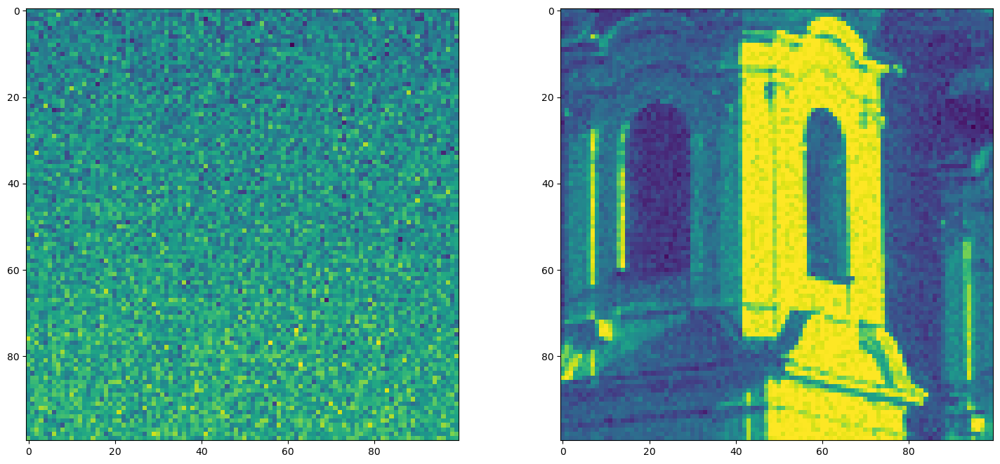

In [ ]:
patch_size =100
noisy_test = img_arr[20].img0.img[:,:,0]
flatRegion = noisy_test[0:patch_size, 40:(40+patch_size)]
notFlatRegion = noisy_test[150:(150+patch_size), 250:(250+patch_size)]
fig = plt.subplots(1,2, figsize=(18,8))
plt.subplot(1, 2, 1)
plt.imshow(flatRegion)
plt.subplot(1, 2, 2)
plt.imshow(notFlatRegion)

Variance: 0.001955703608794858


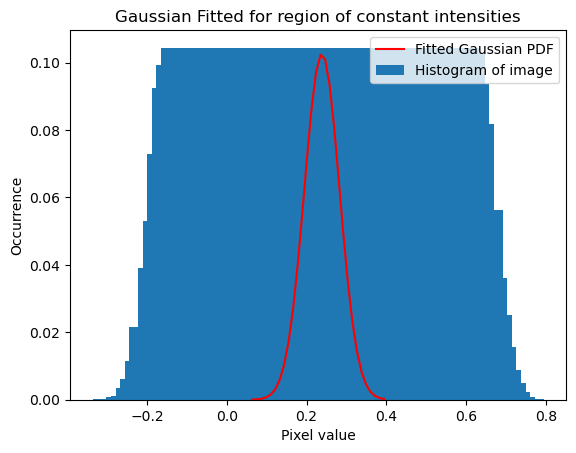

Variance: 0.08581390193916943


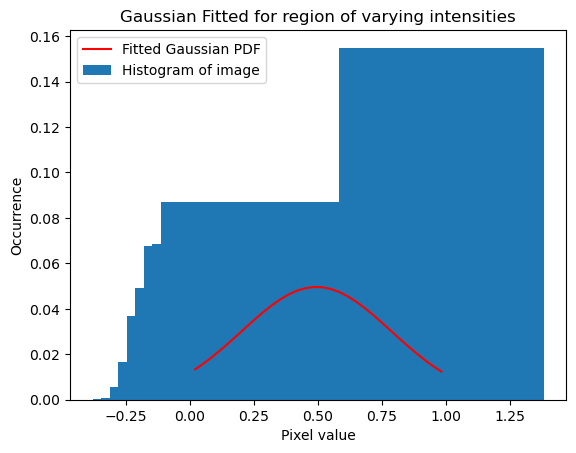

In [ ]:
noise_estimation(flatRegion, 'Gaussian Fitted for region of constant intensities')
noise_estimation(notFlatRegion, 'Gaussian Fitted for region of varying intensities')

# **Denoising**

# **Finding K for Noisy 10**

In [ ]:
k_values = [0.1, 0.75, 1.5, 2, 5, 10]
i = 11

img_arr[i].img0.mse = getMSE(img_arr[i].original_img, img_arr[i].img0.img)
img_arr[i].img0.ssim = getSSIM(img_arr[i].original_img, img_arr[i].img0.img)
img_arr[i].img0.psnr = getPSNR(img_arr[i].original_img, img_arr[i].img0.img)
ideal_img = fft_color(img_arr[i].img0.img,'wiener', None, None, 0, 3)
least_mse = getMSE(img_arr[i].original_img, ideal_img)
img_arr[i].img0_filtered_list = []
img_arr[i].img0_filtered.mse_list = []
img_arr[i].img0_filtered.ssim_list = []
for k in k_values:
  img_arr[i].img0_filtered.img = fft_color(img_arr[i].img0.img,'wiener', None, None, k, 3)
  img_arr[i].img0_filtered_list.append(img_arr[i].img0_filtered.img)
  temp_mse = getMSE(img_arr[i].original_img, img_arr[i].img0_filtered.img)
  img_arr[i].img0_filtered.mse_list.append(temp_mse)
  img_arr[i].img0_filtered.ssim_list.append(getSSIM(img_arr[i].original_img, img_arr[i].img0_filtered.img))

  if temp_mse < least_mse:
    img_arr[i].img0.best_k = k
    img_arr[i].img0.best_mse = temp_mse


C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\2912514903.py:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(original, noisy, multichannel=True)


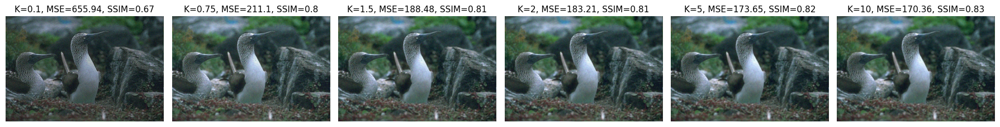

In [ ]:
fig, ax = plt.subplots(1,len(img_arr[i].img0_filtered_list), figsize=(18,12))
for j in range(len(k_values)):
  ax[j].imshow(img_arr[i].img0_filtered_list[j])
  ax[j].set_title('K='+str(k_values[j])+', '+'MSE='+str(round(img_arr[i].img0_filtered.mse_list[j],2))+', SSIM='+str(round(img_arr[i].img0_filtered.ssim_list[j],2)), fontsize = 11)
  ax[j].set_axis_off()
  fig.tight_layout()

In [ ]:
img_arr[i].img0.mse

174.98273288675557

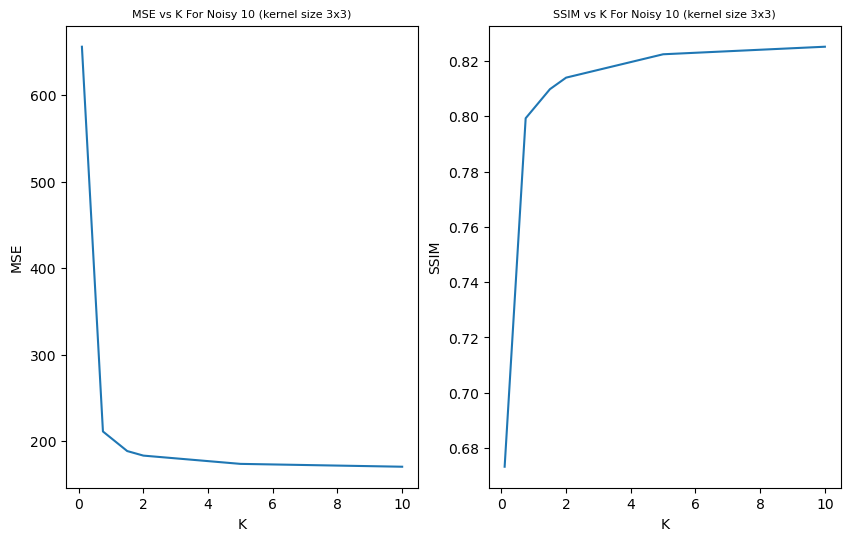

In [ ]:
fig = plt.subplots(1,2, figsize=(10,6))

plt.subplot(1, 2, 1)
plt.plot(k_values,img_arr[i].img0_filtered.mse_list)
plt.xlabel('K')
plt.ylabel('MSE')
plt.title('MSE vs K For Noisy 10 (kernel size 3x3)', fontsize = 8)

plt.subplot(1, 2, 2)
plt.plot(k_values,img_arr[i].img0_filtered.ssim_list)
plt.xlabel('K')
plt.ylabel('SSIM')
plt.title('SSIM vs K For Noisy 10 (kernel size 3x3)', fontsize = 8)
plt.show()

# **Finding K for Noisy 25**

In [ ]:
k_values = [1.0, 2.5, 5.0, 10.0, 12.5, 50]
i = 11

img_arr[i].img1.mse = getMSE(img_arr[i].original_img, img_arr[i].img1.img)
img_arr[i].img1.ssim = getSSIM(img_arr[i].original_img, img_arr[i].img1.img)
img_arr[i].img1.psnr = getPSNR(img_arr[i].original_img, img_arr[i].img1.img)
ideal_img = fft_color(img_arr[i].img1.img,'wiener', None, None, 0, 5)
least_mse = getMSE(img_arr[i].original_img, ideal_img)
img_arr[i].img1_filtered_list = []
img_arr[i].img1_filtered.mse_list = []
img_arr[i].img1_filtered.ssim_list = []
for k in k_values:
  img_arr[i].img1_filtered.img = fft_color(img_arr[i].img1.img,'wiener', None, None, k, 5)
  img_arr[i].img1_filtered_list.append(img_arr[i].img1_filtered.img)
  temp_mse = getMSE(img_arr[i].original_img, img_arr[i].img1_filtered.img)
  img_arr[i].img1_filtered.mse_list.append(temp_mse)
  img_arr[i].img1_filtered.ssim_list.append(getSSIM(img_arr[i].original_img, img_arr[i].img1_filtered.img))

  if temp_mse < least_mse:
    img_arr[i].img1.best_k = k
    img_arr[i].img1.best_mse = temp_mse

C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\2912514903.py:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(original, noisy, multichannel=True)


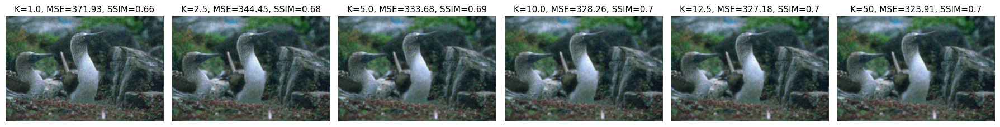

In [ ]:
fig, ax = plt.subplots(1,len(img_arr[i].img1_filtered_list), figsize=(18,12))
for j in range(len(k_values)):
  ax[j].imshow(img_arr[i].img1_filtered_list[j])
  ax[j].set_title('K='+str(k_values[j])+', '+'MSE='+str(round(img_arr[i].img1_filtered.mse_list[j],2))+', SSIM='+str(round(img_arr[i].img1_filtered.ssim_list[j],2)), fontsize = 11)
  ax[j].set_axis_off()
  fig.tight_layout()

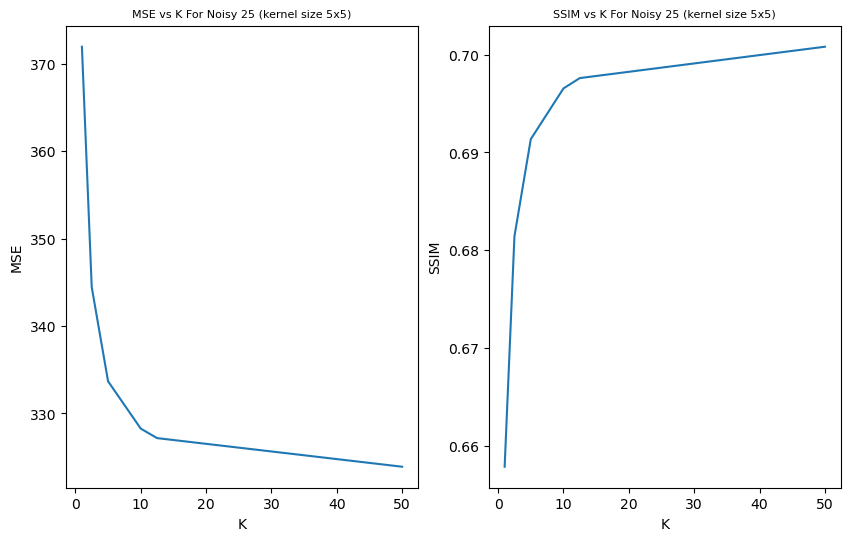

In [ ]:
fig = plt.subplots(1,2, figsize=(10,6))

plt.subplot(1, 2, 1)
plt.plot(k_values,img_arr[i].img1_filtered.mse_list)
plt.xlabel('K')
plt.ylabel('MSE')
plt.title('MSE vs K For Noisy 25 (kernel size 5x5)', fontsize = 8)

plt.subplot(1, 2, 2)
plt.plot(k_values,img_arr[i].img1_filtered.ssim_list)
plt.xlabel('K')
plt.ylabel('SSIM')
plt.title('SSIM vs K For Noisy 25 (kernel size 5x5)', fontsize = 8)
plt.show()

# **Finding K for Noisy 50**

In [ ]:
k_values = [1.0, 5.0, 25.0, 45.0, 50.0, 100.0]
i = 11

img_arr[i].img2.mse = getMSE(img_arr[i].original_img, img_arr[i].img2.img)
img_arr[i].img2.ssim = getSSIM(img_arr[i].original_img, img_arr[i].img2.img)
img_arr[i].img2.psnr = getPSNR(img_arr[i].original_img, img_arr[i].img2.img)

ideal_img = fft_color(img_arr[i].img2.img,'wiener', None, None, 0, 5)
least_mse = getMSE(img_arr[i].original_img, ideal_img)
img_arr[i].img2_filtered_list = []
img_arr[i].img2_filtered.mse_list = []
img_arr[i].img2_filtered.ssim_list = []
for k in k_values:
  img_arr[i].img2_filtered.img = fft_color(img_arr[i].img2.img,'wiener', None, None, k, 5)
  img_arr[i].img2_filtered_list.append(img_arr[i].img2_filtered.img)
  temp_mse = getMSE(img_arr[i].original_img, img_arr[i].img2_filtered.img)
  img_arr[i].img2_filtered.mse_list.append(temp_mse)
  img_arr[i].img2_filtered.ssim_list.append(getSSIM(img_arr[i].original_img, img_arr[i].img2_filtered.img))

  if temp_mse < least_mse:
    img_arr[i].img2.best_k = k
    img_arr[i].img2.best_mse = temp_mse

C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\2912514903.py:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(original, noisy, multichannel=True)


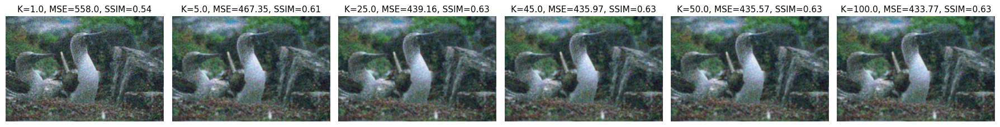

In [ ]:
fig, ax = plt.subplots(1,len(img_arr[i].img2_filtered_list), figsize=(18,12))
for j in range(len(k_values)):
  ax[j].imshow(img_arr[i].img2_filtered_list[j])
  ax[j].set_title('K='+str(k_values[j])+', '+'MSE='+str(round(img_arr[i].img2_filtered.mse_list[j],2))+', SSIM='+str(round(img_arr[i].img2_filtered.ssim_list[j],2)), fontsize = 11)
  ax[j].set_axis_off()
  fig.tight_layout()

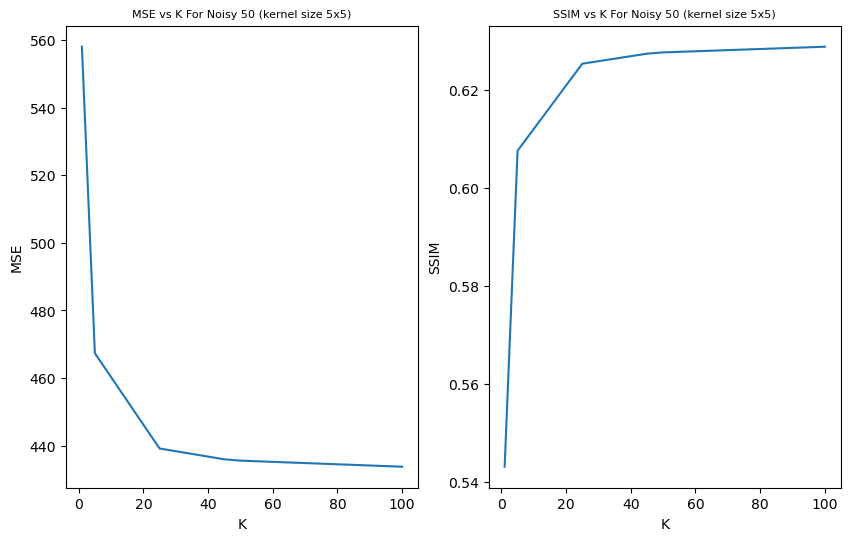

In [ ]:
fig = plt.subplots(1,2, figsize=(10,6))

plt.subplot(1, 2, 1)
plt.plot(k_values,img_arr[i].img2_filtered.mse_list)
plt.xlabel('K')
plt.ylabel('MSE')
plt.title('MSE vs K For Noisy 50 (kernel size 5x5)', fontsize = 8)

plt.subplot(1, 2, 2)
plt.plot(k_values,img_arr[i].img2_filtered.ssim_list)
plt.xlabel('K')
plt.ylabel('SSIM')
plt.title('SSIM vs K For Noisy 50 (kernel size 5x5)', fontsize = 8)
plt.show()

In [ ]:
print(getPSNR(img_arr[i].original_img[:,:,0],img_arr[i].img2_filtered_list[5][:,:,0]))

22.598090634343905


# **Loop for filtering all images**

In [ ]:
#Noisy 10


k = 1.5
for i in range(len(img_arr)):
  img_arr[i].img0.mse = getMSE(img_arr[i].original_img, img_arr[i].img0.img)
  img_arr[i].img0.ssim = getSSIM(img_arr[i].original_img, img_arr[i].img0.img)
  img_arr[i].img0.psnr = getPSNR(img_arr[i].original_img, img_arr[i].img0.img)

  img_arr[i].img0_filtered.img = fft_color(img_arr[i].img0.img,'wiener', None, None, k, 3)
  img_arr[i].img0_filtered_list.append(img_arr[i].img0_filtered.img)
  temp_mse = getMSE(img_arr[i].original_img, img_arr[i].img0_filtered.img)
  temp_ssim = getSSIM(img_arr[i].original_img, img_arr[i].img0_filtered.img)

  img_arr[i].img0_filtered.mse_list.append(temp_mse)
  img_arr[i].img0_filtered.ssim_list.append(temp_ssim)


  img_arr[i].img0_filtered.best_k = k
  img_arr[i].img0_filtered.best_mse = temp_mse
  img_arr[i].img0_filtered.best_ssim = temp_ssim

#Noisy 25
k = 12.5
for i in range(len(img_arr)):
  img_arr[i].img1.mse = getMSE(img_arr[i].original_img, img_arr[i].img1.img)
  img_arr[i].img1.ssim = getSSIM(img_arr[i].original_img, img_arr[i].img1.img)
  img_arr[i].img1.psnr = getPSNR(img_arr[i].original_img, img_arr[i].img1.img)

  img_arr[i].img1_filtered.img = fft_color(img_arr[i].img1.img,'wiener', None, None, k, 5)
  img_arr[i].img1_filtered_list.append(img_arr[i].img1_filtered.img)

  temp_mse = getMSE(img_arr[i].original_img, img_arr[i].img1_filtered.img)
  temp_ssim = getSSIM(img_arr[i].original_img, img_arr[i].img1_filtered.img)
  img_arr[i].img1_filtered.mse_list.append(temp_mse)
  img_arr[i].img1_filtered.ssim_list.append(temp_ssim)

  img_arr[i].img1_filtered.best_k = k
  img_arr[i].img1_filtered.best_mse = temp_mse
  img_arr[i].img1_filtered.best_ssim = temp_ssim

#Noisy 50
k = 45
for i in range(len(img_arr)):
  img_arr[i].img2.mse = getMSE(img_arr[i].original_img, img_arr[i].img2.img)
  img_arr[i].img2.ssim = getSSIM(img_arr[i].original_img, img_arr[i].img2.img)
  img_arr[i].img2.psnr = getPSNR(img_arr[i].original_img, img_arr[i].img2.img)

  img_arr[i].img2_filtered.img = fft_color(img_arr[i].img2.img,'wiener', None, None, k, 5)
  img_arr[i].img2_filtered_list.append(img_arr[i].img2_filtered)

  temp_mse = getMSE(img_arr[i].original_img, img_arr[i].img2_filtered.img)
  temp_ssim = getSSIM(img_arr[i].original_img, img_arr[i].img2_filtered.img)
  img_arr[i].img2_filtered.mse_list.append(temp_mse)
  img_arr[i].img2_filtered.ssim_list.append(temp_ssim)

  img_arr[i].img2_filtered.best_k = k
  img_arr[i].img2_filtered.best_mse = temp_mse
  img_arr[i].img2_filtered.best_ssim = temp_ssim

C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\2912514903.py:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(original, noisy, multichannel=True)


# **Denoising using Mean, Median, Wavelet (Visushrink and Bayes)**

In [ ]:
#Noisy 10
for i in range(len(img_arr)):
  img_arr[i].img0_mean_fltr.img = other_filters(img_arr[i].img0.img, 'mean')
  img_arr[i].img0_mean_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img0_mean_fltr.img )
  img_arr[i].img0_mean_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img0_mean_fltr.img )

  img_arr[i].img0_median_fltr.img = other_filters(img_arr[i].img0.img, 'median')
  img_arr[i].img0_median_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img0_median_fltr.img )
  img_arr[i].img0_median_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img0_median_fltr.img )

  img_arr[i].img0_visu_fltr.img = other_filters(img_arr[i].img0.img, 'visu')
  img_arr[i].img0_visu_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img0_visu_fltr.img )
  img_arr[i].img0_visu_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img0_visu_fltr.img )

  img_arr[i].img0_bayes_fltr.img = other_filters(img_arr[i].img0.img, 'bayes')
  img_arr[i].img0_bayes_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img0_bayes_fltr.img )
  img_arr[i].img0_bayes_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img0_bayes_fltr.img )

#Noisy 25
for i in range(len(img_arr)):
  img_arr[i].img1_mean_fltr.img = other_filters(img_arr[i].img1.img, 'mean')
  img_arr[i].img1_mean_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img1_mean_fltr.img )
  img_arr[i].img1_mean_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img1_mean_fltr.img )

  img_arr[i].img1_median_fltr.img = other_filters(img_arr[i].img1.img, 'median')
  img_arr[i].img1_median_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img1_median_fltr.img )
  img_arr[i].img1_median_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img1_median_fltr.img )

  img_arr[i].img1_visu_fltr.img = other_filters(img_arr[i].img1.img, 'visu')
  img_arr[i].img1_visu_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img1_visu_fltr.img )
  img_arr[i].img1_visu_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img1_visu_fltr.img )

  img_arr[i].img1_bayes_fltr.img = other_filters(img_arr[i].img1.img, 'bayes')
  img_arr[i].img1_bayes_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img1_bayes_fltr.img )
  img_arr[i].img1_bayes_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img1_bayes_fltr.img )

#Noisy 50
for i in range(len(img_arr)):
  img_arr[i].img2_mean_fltr.img = other_filters(img_arr[i].img2.img, 'mean')
  img_arr[i].img2_mean_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img2_mean_fltr.img )
  img_arr[i].img2_mean_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img2_mean_fltr.img )

  img_arr[i].img2_median_fltr.img = other_filters(img_arr[i].img2.img, 'median')
  img_arr[i].img2_median_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img2_median_fltr.img )
  img_arr[i].img2_median_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img2_median_fltr.img )

  img_arr[i].img2_visu_fltr.img = other_filters(img_arr[i].img2.img, 'visu')
  img_arr[i].img2_visu_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img2_visu_fltr.img )
  img_arr[i].img2_visu_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img2_visu_fltr.img )

  img_arr[i].img2_bayes_fltr.img = other_filters(img_arr[i].img2.img, 'bayes')
  img_arr[i].img2_bayes_fltr.mse = getMSE(img_arr[i].original_img,img_arr[i].img2_bayes_fltr.img )
  img_arr[i].img2_bayes_fltr.ssim = getSSIM(img_arr[i].original_img,img_arr[i].img2_bayes_fltr.img )


C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\2912514903.py:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(original, noisy, multichannel=True)
C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\1915942039.py:4: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  final_image = denoise_wavelet(im, multichannel=True, convert2ycbcr=True,
C:\Users\Paul Jr\AppData\Local\Temp\ipykernel_14668\1915942039.py:8: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  final_image = denoise_wavelet(im, multichannel=True, convert2ycbcr=True,


# **Analyzing Results**

# **Images Filtered Using Algorithm mentioned**

Noisy Images Comparision

Text(0.5, 1.0, 'Denoised Image:K=45, MSE=467.9681, SSIM=0.69')

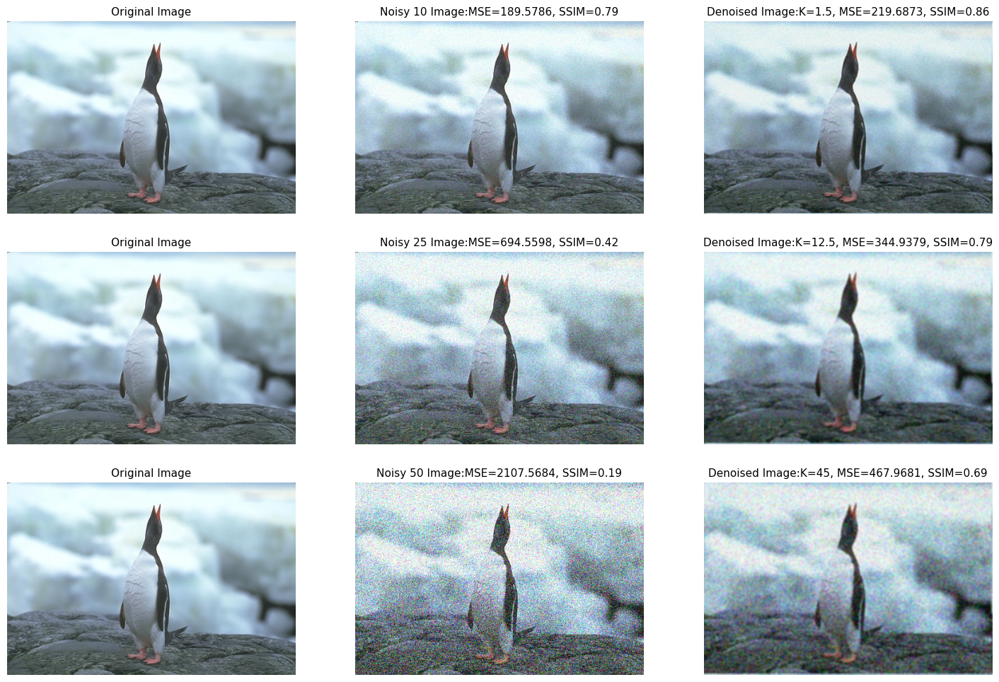

In [ ]:
fig = plt.subplots(3,3, figsize=(18,12))

j = 13
plt.subplot(3, 3, 1)
plt.imshow(img_arr[j].original_img)
plt.axis('off')
plt.title('Original Image', fontsize = 11)

plt.subplot(3, 3, 2)
plt.imshow(img_arr[j].img0.img)
plt.axis('off')
plt.title('Noisy 10 Image:'+'MSE='+str(round(img_arr[j].img0.mse,4))+', SSIM='+str(round(img_arr[j].img0.ssim,2)), fontsize = 11)

plt.subplot(3, 3, 3)
plt.imshow(img_arr[j].img0_filtered.img)
plt.axis('off')
plt.title('Denoised Image:'+'K='+str(img_arr[j].img0_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img0_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img0_filtered.best_ssim,2)), fontsize = 11)



plt.subplot(3, 3, 4)
plt.imshow(img_arr[j].original_img)
plt.axis('off')
plt.title('Original Image', fontsize = 11)

plt.subplot(3, 3, 5)
plt.imshow(img_arr[j].img1.img)
plt.axis('off')
plt.title('Noisy 25 Image:'+'MSE='+str(round(img_arr[j].img1.mse,4))+', SSIM='+str(round(img_arr[j].img1.ssim,2)), fontsize = 11)
#+'MSE='+str(round(img_arr[j].img1.mse,4))+', SSIM='+str(round(img_arr[j].img1.ssim,2))

plt.subplot(3, 3, 6)
plt.imshow(img_arr[j].img1_filtered.img)
plt.axis('off')
plt.title('Denoised Image:'+'K='+str(img_arr[j].img1_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img1_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img1_filtered.best_ssim,2)), fontsize = 11)




plt.subplot(3, 3, 7)
plt.imshow(img_arr[j].original_img)
plt.axis('off')
plt.title('Original Image', fontsize = 11)

plt.subplot(3, 3, 8)
plt.imshow(img_arr[j].img2.img)
plt.axis('off')
plt.title('Noisy 50 Image:'+'MSE='+str(round(img_arr[j].img2.mse,4))+', SSIM='+str(round(img_arr[j].img2.ssim,2)), fontsize = 11)
#:'+'MSE='+str(round(img_arr[j].img2.mse,4))+', SSIM='+str(round(img_arr[j].img2.ssim,2))

plt.subplot(3, 3, 9)
plt.imshow(img_arr[j].img2_filtered.img)
plt.axis('off')
plt.title('Denoised Image:'+'K='+str(img_arr[j].img2_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img2_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img2_filtered.best_ssim,2)), fontsize = 11)



Noisy 10 Filtered

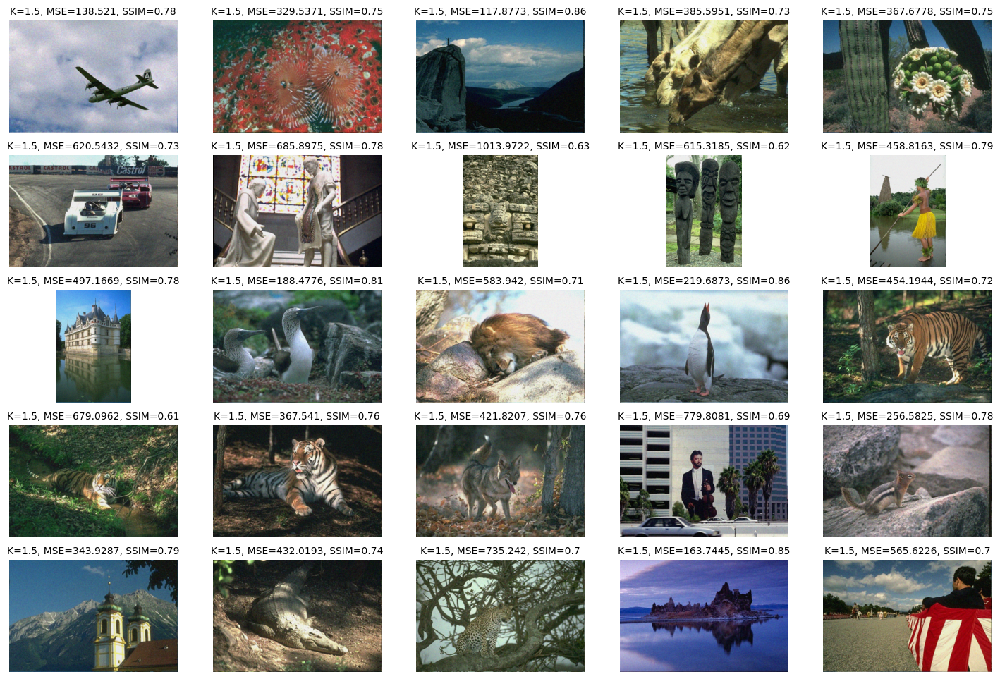

In [ ]:
fig = plt.subplots(5,25, figsize=(18,12))

for j in range(len(img_arr)):
  plt.subplot(5, 5, j+1)
  plt.imshow(img_arr[j].img0_filtered.img)
  plt.axis('off')
  plt.title('K='+str(img_arr[j].img0_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img0_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img0_filtered.best_ssim,2)), fontsize = 10)


Noisy 25 Filtered

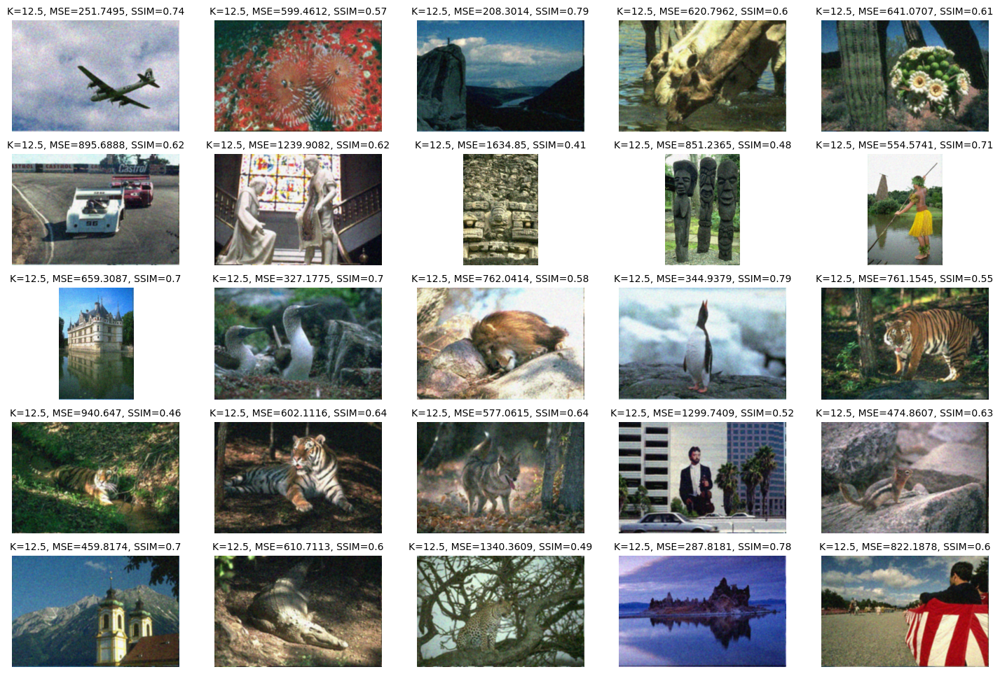

In [ ]:
fig = plt.subplots(5,25, figsize=(18,12))
for j in range(len(img_arr)):
  plt.subplot(5, 5, j+1)
  plt.imshow(img_arr[j].img1_filtered.img)
  plt.axis('off')
  plt.title('K='+str(img_arr[j].img1_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img1_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img1_filtered.best_ssim,2)), fontsize = 10)


Noisy 50 Filtered

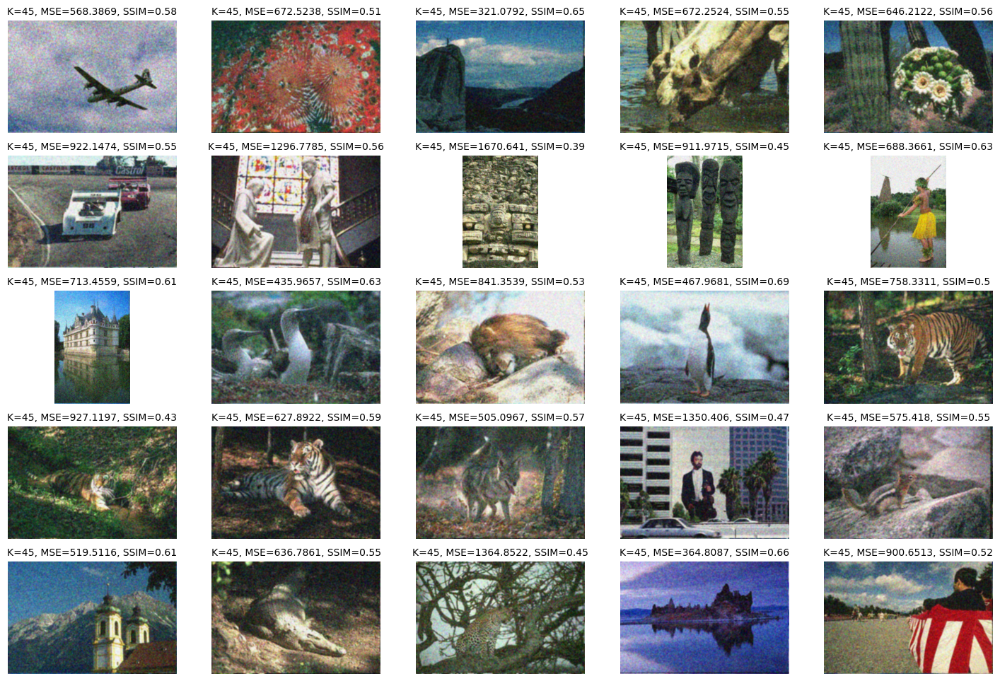

In [ ]:
fig = plt.subplots(5,25, figsize=(18,12))
for j in range(len(img_arr)):
  plt.subplot(5, 5, j+1)
  plt.imshow(img_arr[j].img2_filtered.img)
  plt.axis('off')
  plt.title('K='+str(img_arr[j].img2_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img2_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img2_filtered.best_ssim,2)), fontsize = 10)


# **Comparision with images Filtered Using Mean, Median, Wavelet Methods**

Text(0.5, 1.0, 'Bayes:MSE=1820.9327, SSIM=0.5')

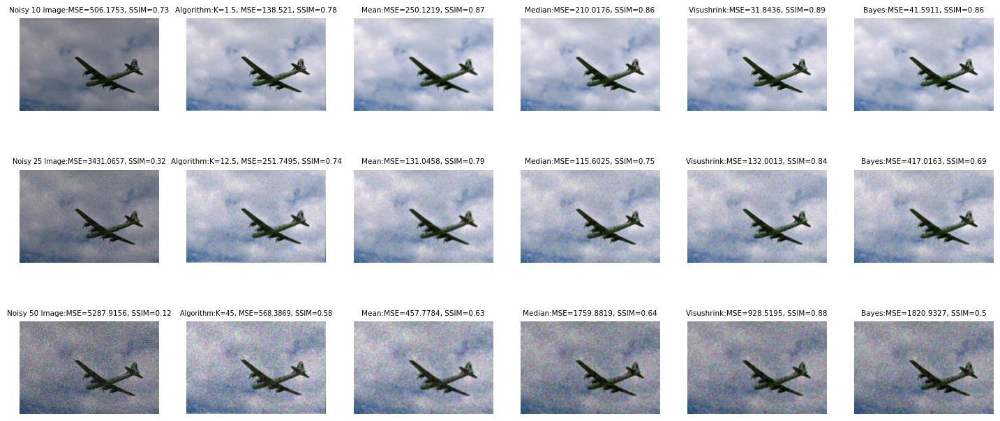

In [ ]:
fig = plt.subplots(3,6, figsize=(18,8))

j = 0
plt.subplot(3, 6, 1)
plt.imshow(img_arr[j].img0.img)
plt.axis('off')
plt.title('Noisy 10 Image:'+'MSE='+str(round(img_arr[j].img0.mse,4))+', SSIM='+str(round(img_arr[j].img0.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 2)
plt.imshow(img_arr[j].img0_filtered.img)
plt.axis('off')
plt.title('Algorithm:'+'K='+str(img_arr[j].img0_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img0_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img0_filtered.best_ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 3)
plt.imshow(img_arr[j].img0_mean_fltr.img)
plt.axis('off')
plt.title('Mean:'+'MSE='+str(round(img_arr[j].img0_mean_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img0_mean_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 4)
plt.imshow(img_arr[j].img0_median_fltr.img)
plt.axis('off')
plt.title('Median:'+'MSE='+str(round(img_arr[j].img0_median_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img0_median_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 5)
plt.imshow(img_arr[j].img0_median_fltr.img)
plt.axis('off')
plt.title('Visushrink:'+'MSE='+str(round(img_arr[j].img0_visu_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img0_visu_fltr.ssim,2)), fontsize = 7.5)


plt.subplot(3, 6, 6)
plt.imshow(img_arr[j].img0_median_fltr.img)
plt.axis('off')
plt.title('Bayes:'+'MSE='+str(round(img_arr[j].img0_bayes_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img0_bayes_fltr.ssim,2)), fontsize = 7.5)

#Noisy 25

plt.subplot(3, 6, 7)
plt.imshow(img_arr[j].img1.img)
plt.axis('off')
plt.title('Noisy 25 Image:'+'MSE='+str(round(img_arr[j].img1.mse,4))+', SSIM='+str(round(img_arr[j].img1.ssim,2)), fontsize = 7)

plt.subplot(3, 6, 8)
plt.imshow(img_arr[j].img1_filtered.img)
plt.axis('off')
plt.title('Algorithm:'+'K='+str(img_arr[j].img1_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img1_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img1_filtered.best_ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 9)
plt.imshow(img_arr[j].img1_mean_fltr.img)
plt.axis('off')
plt.title('Mean:'+'MSE='+str(round(img_arr[j].img1_mean_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img1_mean_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 10)
plt.imshow(img_arr[j].img1_median_fltr.img)
plt.axis('off')
plt.title('Median:'+'MSE='+str(round(img_arr[j].img1_median_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img1_median_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 11)
plt.imshow(img_arr[j].img1_median_fltr.img)
plt.axis('off')
plt.title('Visushrink:'+'MSE='+str(round(img_arr[j].img1_visu_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img1_visu_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 12)
plt.imshow(img_arr[j].img1_median_fltr.img)
plt.axis('off')
plt.title('Bayes:'+'MSE='+str(round(img_arr[j].img1_bayes_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img1_bayes_fltr.ssim,2)), fontsize = 7.5)

#Noisy 50
plt.subplot(3, 6, 13)
plt.imshow(img_arr[j].img2.img)
plt.axis('off')
plt.title('Noisy 50 Image:'+'MSE='+str(round(img_arr[j].img2.mse,4))+', SSIM='+str(round(img_arr[j].img2.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 14)
plt.imshow(img_arr[j].img2_filtered.img)
plt.axis('off')
plt.title('Algorithm:'+'K='+str(img_arr[j].img2_filtered.best_k)+', '+'MSE='+str(round(img_arr[j].img2_filtered.best_mse,4))+', SSIM='+str(round(img_arr[j].img2_filtered.best_ssim,2)), fontsize =7)

plt.subplot(3, 6, 15)
plt.imshow(img_arr[j].img2_mean_fltr.img)
plt.axis('off')
plt.title('Mean:'+'MSE='+str(round(img_arr[j].img2_mean_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img2_mean_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 16)
plt.imshow(img_arr[j].img2_median_fltr.img)
plt.axis('off')
plt.title('Median:'+'MSE='+str(round(img_arr[j].img2_median_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img2_median_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 17)
plt.imshow(img_arr[j].img2_median_fltr.img)
plt.axis('off')
plt.title('Visushrink:'+'MSE='+str(round(img_arr[j].img2_visu_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img2_visu_fltr.ssim,2)), fontsize = 7.5)

plt.subplot(3, 6, 18)
plt.imshow(img_arr[j].img2_median_fltr.img)
plt.axis('off')
plt.title('Bayes:'+'MSE='+str(round(img_arr[j].img2_bayes_fltr.mse,4))+', SSIM='+str(round(img_arr[j].img2_bayes_fltr.ssim,2)), fontsize = 7.5)

